In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz')

In [6]:
dtfa = DTFA.DeepTFA([b for b in lepping_db.all() if 'response' not in b.task and 'tones' not in b.task],
                    mask='/home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz',num_factors=100, embedding_dim=2)

05/31/2020 14:26:23 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run3_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 14:26:24 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run2_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 14:26:25 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run4_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 14:26:27 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run5_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sou

In [7]:
dtfa.num_parameters()

1281612

In [9]:
dtfa.load_state('data/lepping_noresponse_k100_n2000_05302020_023539')

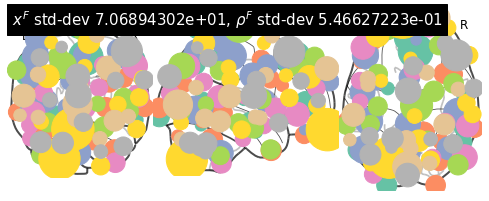

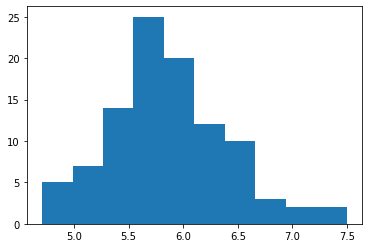

(<nilearn.plotting.displays.OrthoProjector at 0x7f7fb009dc50>,
 tensor([[-2.3280e+01, -4.0352e+00, -2.6981e+01],
         [-1.8002e+00, -1.6585e+01,  7.9973e+00],
         [ 5.6205e+01, -6.0413e+01,  5.8721e+00],
         [ 4.0020e+01,  3.2230e+01, -1.1055e+01],
         [-2.4454e+01, -1.0590e+02, -1.1137e+01],
         [ 5.8748e+00,  3.5206e+01,  5.0307e+01],
         [-1.5320e+00, -6.4773e+01,  8.4000e+01],
         [-3.9274e+01, -6.1980e+01, -2.0091e+01],
         [-3.1137e+00,  4.8780e+01,  2.3117e+00],
         [ 5.7452e+01, -4.4988e+01,  4.8513e+01],
         [ 5.7748e+01, -1.1314e+01, -1.5191e+01],
         [-6.0320e+01, -2.8194e+01,  2.8955e+01],
         [-5.4054e+01, -6.8639e+01,  4.4387e+01],
         [-5.2171e+01,  2.3585e+01,  2.1771e+01],
         [ 3.0587e+01, -8.1012e+01,  2.3606e+01],
         [-1.6592e+01, -8.6252e+01, -3.1602e+01],
         [ 6.8059e+01, -4.6079e+01, -2.1391e+00],
         [-4.6669e+01,  1.3622e+00,  4.9217e+01],
         [-6.6491e+01, -3.8112e+01, -

In [10]:
dtfa.visualize_factor_embedding()

In [11]:
def subject_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [12]:
def task_labeler(task):
    if task == 'negative_music':
        task = 'Negative music'
    elif task == 'positive_music':
        task = 'Positive music'
    elif task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = task.capitalize()
    return task

In [13]:
def lepping_2017_labeler(block):
    task = task_labeler(block.task)
    return task + ' stimulus'

In [14]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

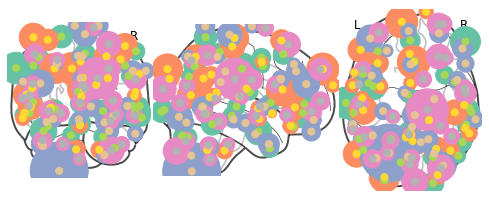

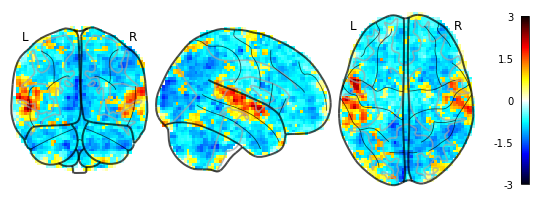

05/31/2020 14:36:40 Reconstruction Error (Frobenius Norm): 1.22247643e+02 out of 7.67137024e+02


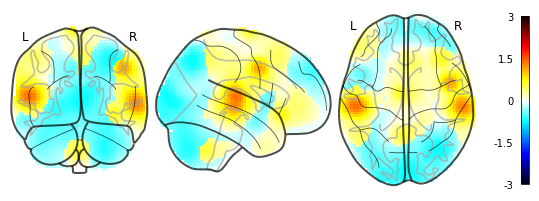

05/31/2020 14:36:41 Reconstruction Error (Frobenius Norm): 8.00086594e+01 out of 7.67137024e+02


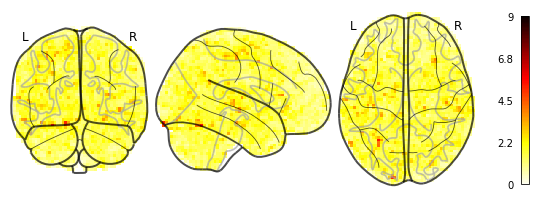

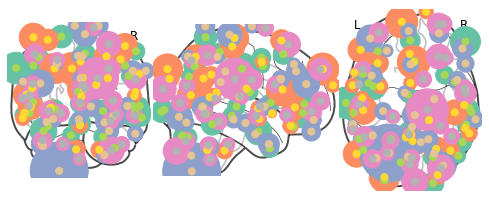

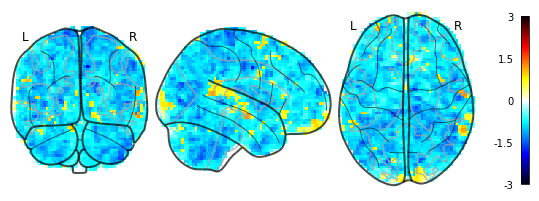

05/31/2020 14:36:45 Reconstruction Error (Frobenius Norm): 1.41668152e+02 out of 9.58201843e+02


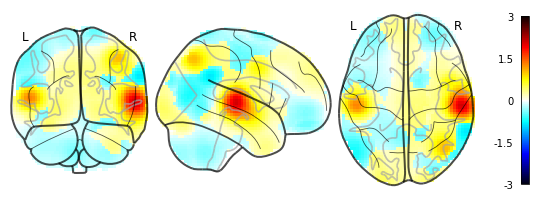

05/31/2020 14:36:46 Reconstruction Error (Frobenius Norm): 7.70325394e+01 out of 9.58201843e+02


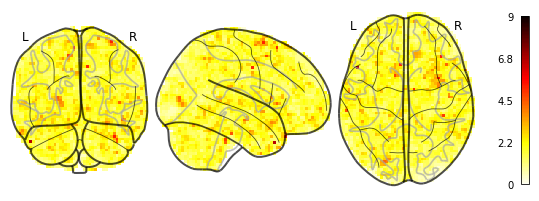

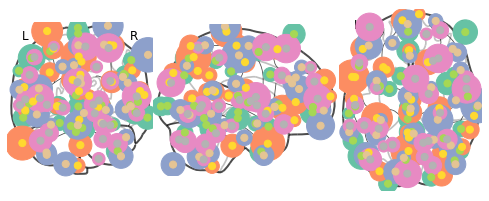

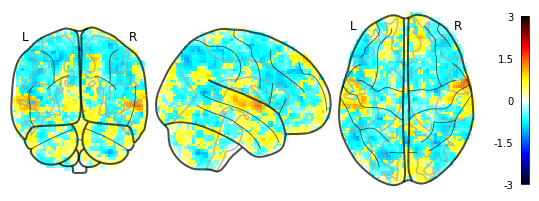

05/31/2020 14:36:49 Reconstruction Error (Frobenius Norm): 9.96572952e+01 out of 7.88558472e+02


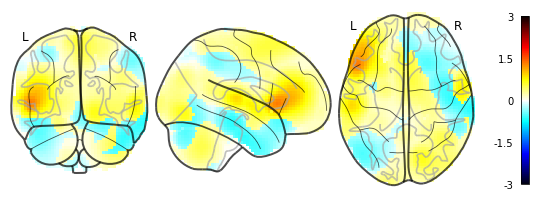

05/31/2020 14:36:51 Reconstruction Error (Frobenius Norm): 6.25005569e+01 out of 7.88558472e+02


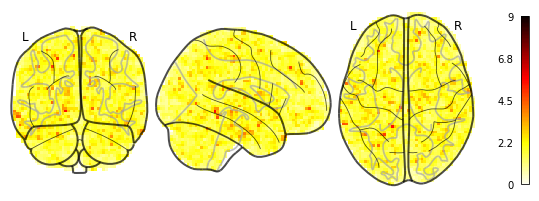

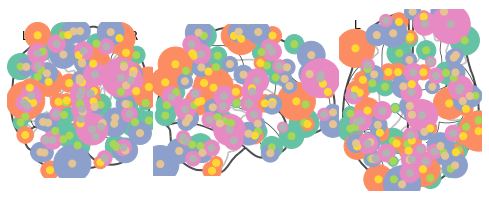

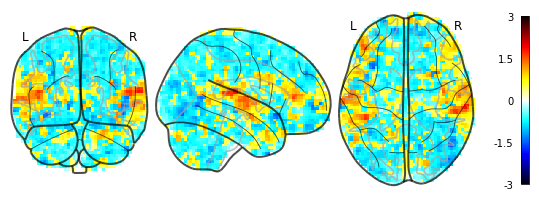

05/31/2020 14:36:54 Reconstruction Error (Frobenius Norm): 1.00545586e+02 out of 8.18825928e+02


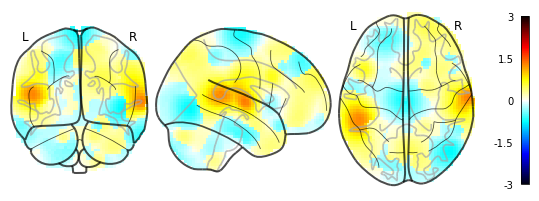

05/31/2020 14:36:56 Reconstruction Error (Frobenius Norm): 7.39519348e+01 out of 8.18825928e+02


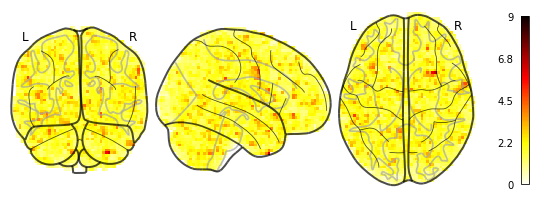

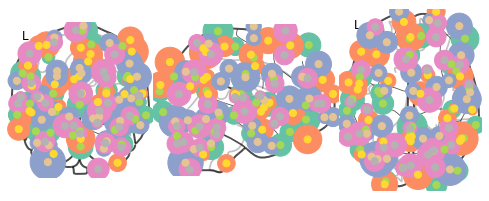

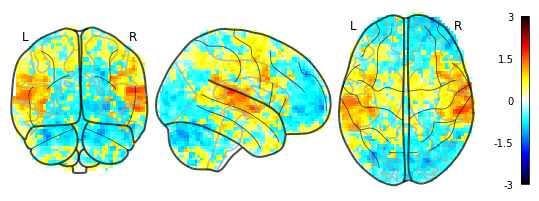

05/31/2020 14:36:59 Reconstruction Error (Frobenius Norm): 1.03725998e+02 out of 8.02983337e+02


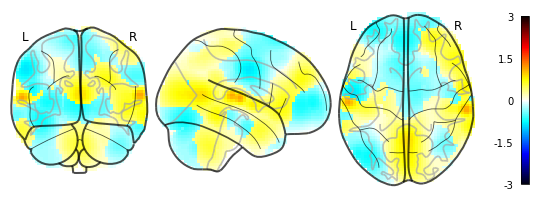

05/31/2020 14:37:01 Reconstruction Error (Frobenius Norm): 6.49903030e+01 out of 8.02983337e+02


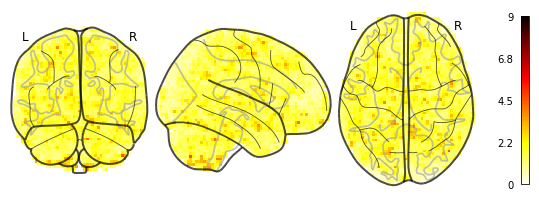

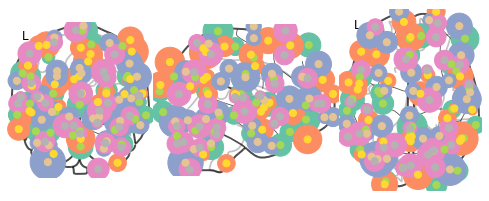

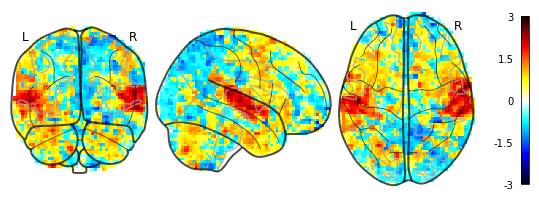

05/31/2020 14:37:04 Reconstruction Error (Frobenius Norm): 1.16999214e+02 out of 9.82731445e+02


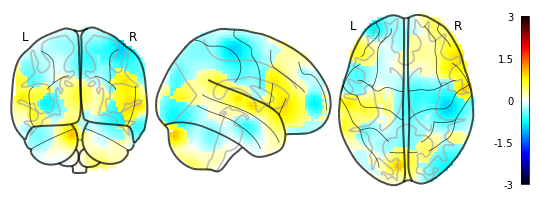

05/31/2020 14:37:06 Reconstruction Error (Frobenius Norm): 8.80426331e+01 out of 9.82731445e+02


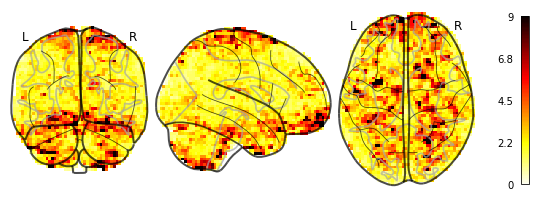

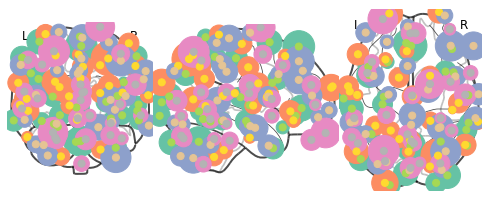

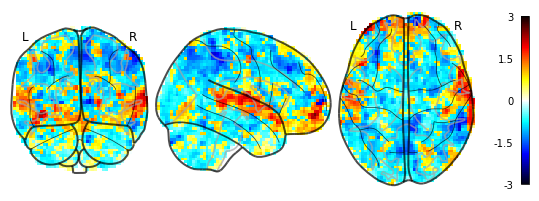

05/31/2020 14:37:09 Reconstruction Error (Frobenius Norm): 1.22342445e+02 out of 7.78388306e+02


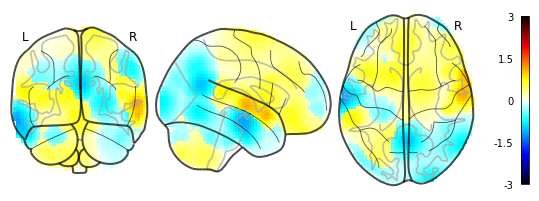

05/31/2020 14:37:11 Reconstruction Error (Frobenius Norm): 9.07545471e+01 out of 7.78388306e+02


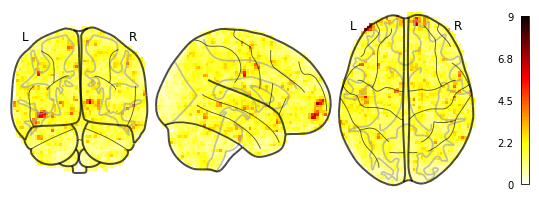

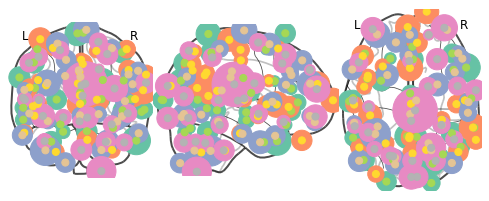

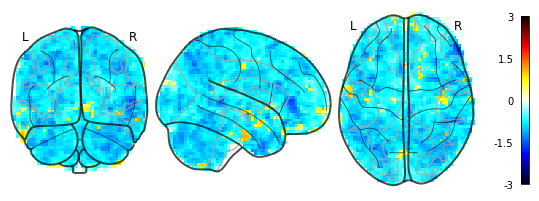

05/31/2020 14:37:14 Reconstruction Error (Frobenius Norm): 1.32481674e+02 out of 8.25541443e+02


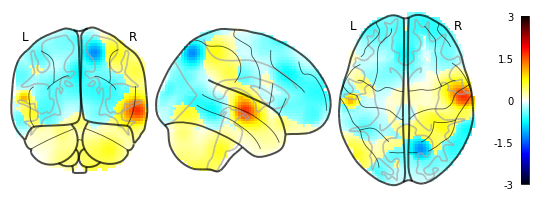

05/31/2020 14:37:16 Reconstruction Error (Frobenius Norm): 6.98124466e+01 out of 8.25541443e+02


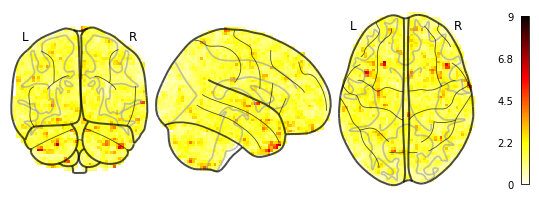

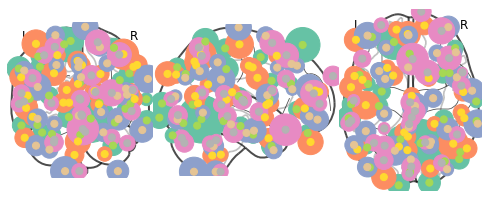

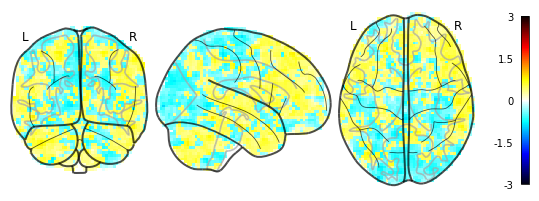

05/31/2020 14:37:19 Reconstruction Error (Frobenius Norm): 1.05315247e+02 out of 7.60057556e+02


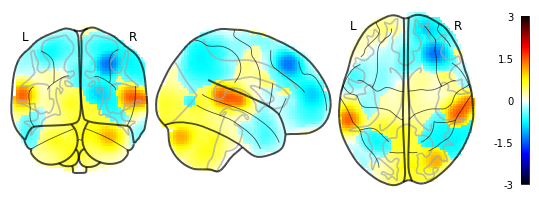

05/31/2020 14:37:20 Reconstruction Error (Frobenius Norm): 4.90495224e+01 out of 7.60057556e+02


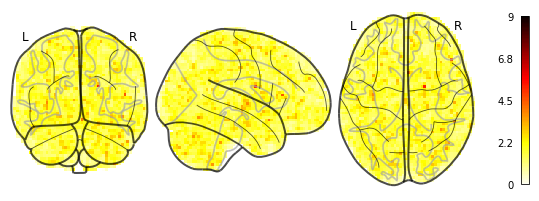

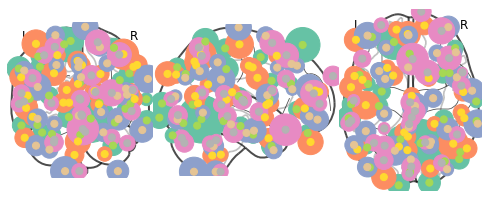

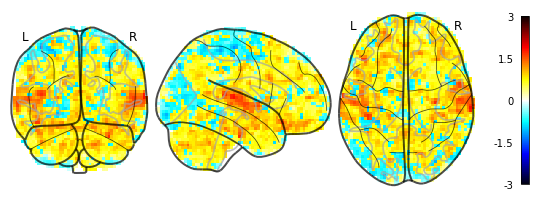

05/31/2020 14:37:24 Reconstruction Error (Frobenius Norm): 1.20012260e+02 out of 8.26601013e+02


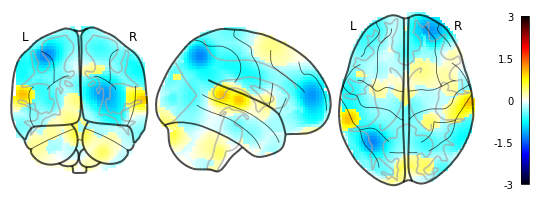

05/31/2020 14:37:25 Reconstruction Error (Frobenius Norm): 7.79263535e+01 out of 8.26601013e+02


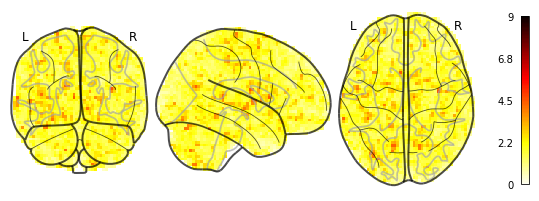

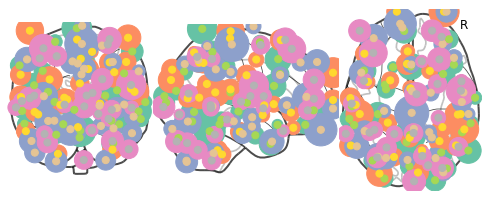

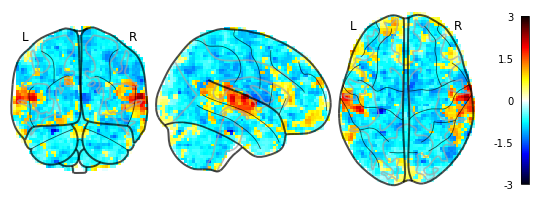

05/31/2020 14:37:29 Reconstruction Error (Frobenius Norm): 1.24069458e+02 out of 7.37839233e+02


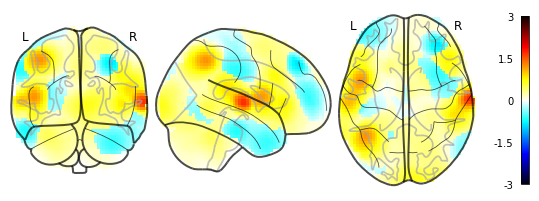

05/31/2020 14:37:30 Reconstruction Error (Frobenius Norm): 7.83005142e+01 out of 7.37839233e+02


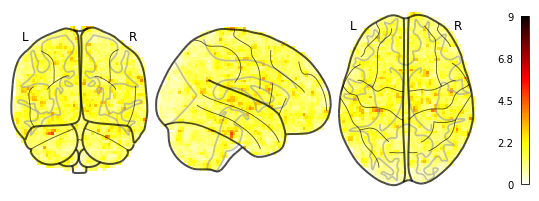

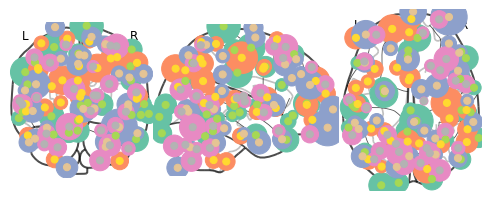

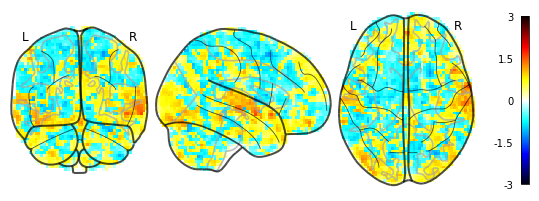

05/31/2020 14:37:34 Reconstruction Error (Frobenius Norm): 9.77652130e+01 out of 8.19254395e+02


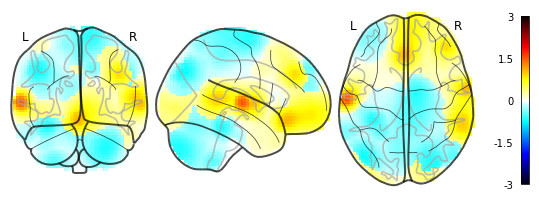

05/31/2020 14:37:35 Reconstruction Error (Frobenius Norm): 7.25664215e+01 out of 8.19254395e+02


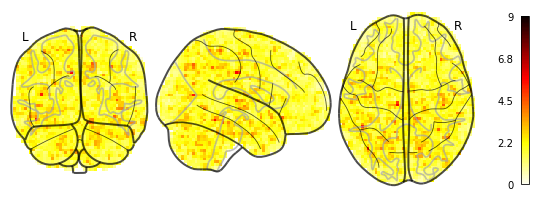

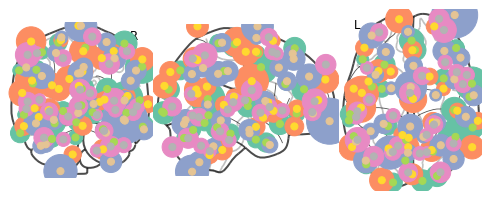

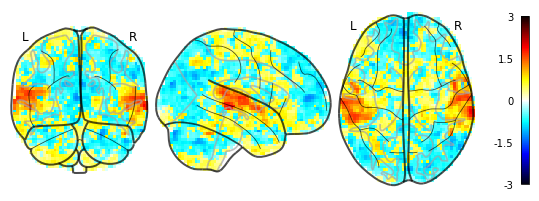

05/31/2020 14:37:39 Reconstruction Error (Frobenius Norm): 8.97235565e+01 out of 7.74554993e+02


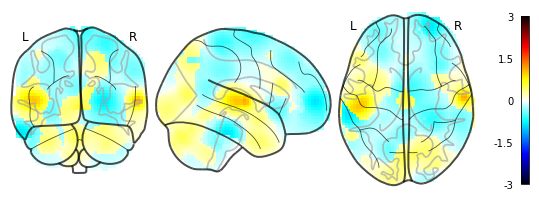

05/31/2020 14:37:40 Reconstruction Error (Frobenius Norm): 6.62243042e+01 out of 7.74554993e+02


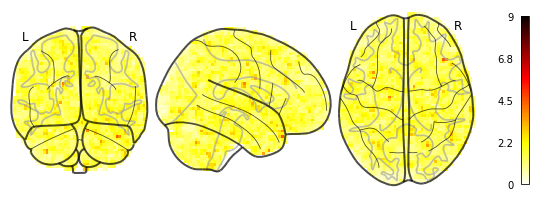

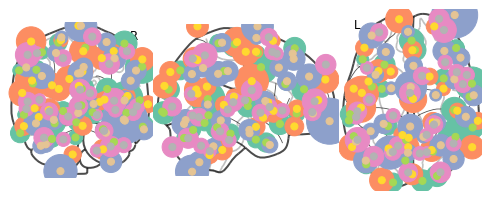

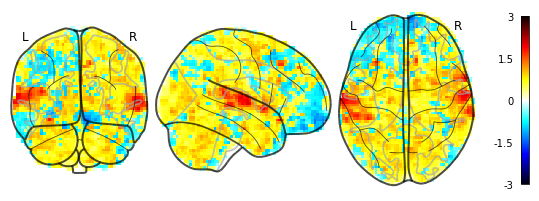

05/31/2020 14:37:43 Reconstruction Error (Frobenius Norm): 1.17114731e+02 out of 7.60746643e+02


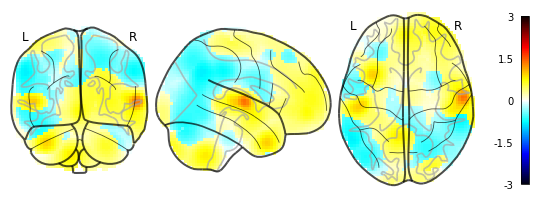

05/31/2020 14:37:45 Reconstruction Error (Frobenius Norm): 7.38700562e+01 out of 7.60746643e+02


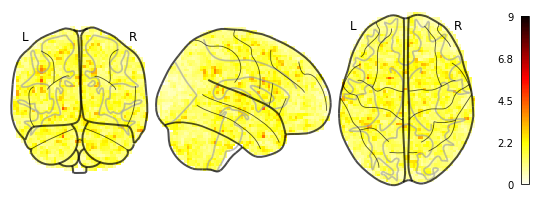

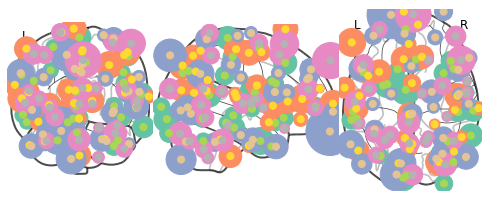

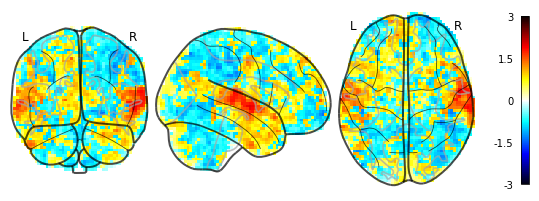

05/31/2020 14:37:48 Reconstruction Error (Frobenius Norm): 1.03023537e+02 out of 8.76528687e+02


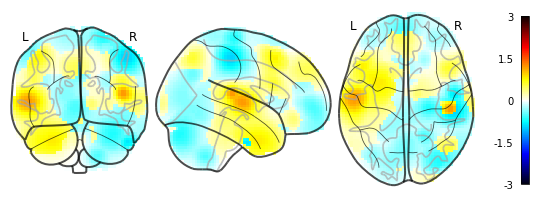

05/31/2020 14:37:50 Reconstruction Error (Frobenius Norm): 7.91345749e+01 out of 8.76528687e+02


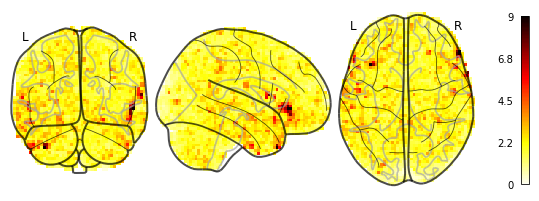

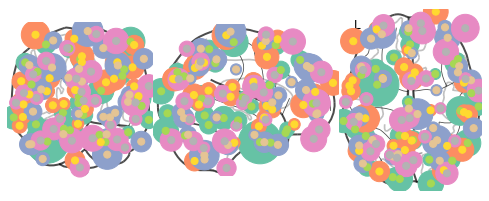

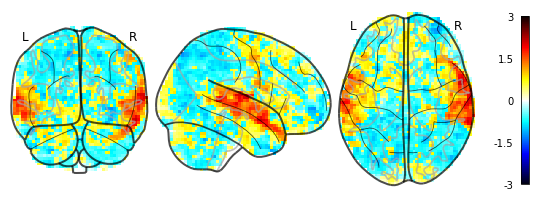

05/31/2020 14:37:53 Reconstruction Error (Frobenius Norm): 8.81554337e+01 out of 8.26226440e+02


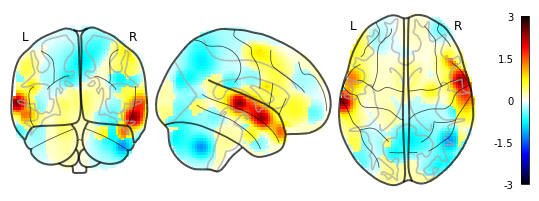

05/31/2020 14:37:55 Reconstruction Error (Frobenius Norm): 7.21233139e+01 out of 8.26226440e+02


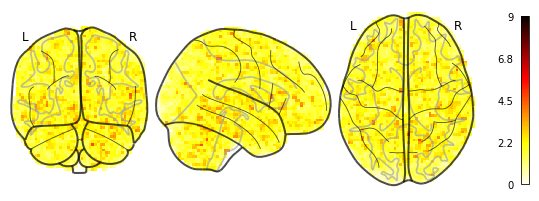

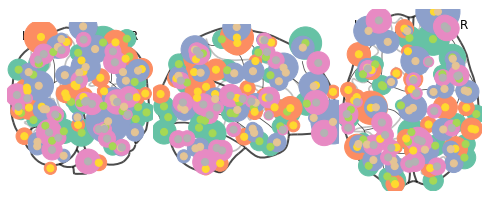

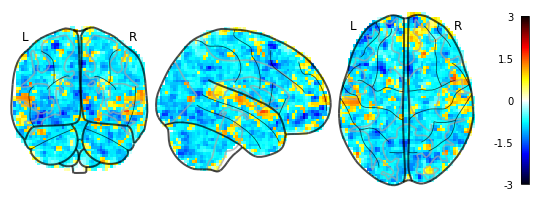

05/31/2020 14:37:58 Reconstruction Error (Frobenius Norm): 1.15047264e+02 out of 8.01213440e+02


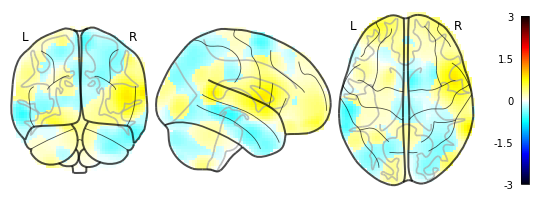

05/31/2020 14:38:00 Reconstruction Error (Frobenius Norm): 8.46181641e+01 out of 8.01213440e+02


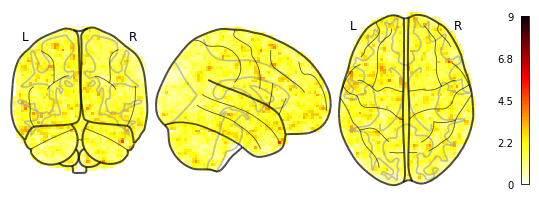

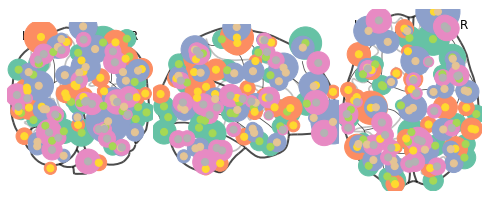

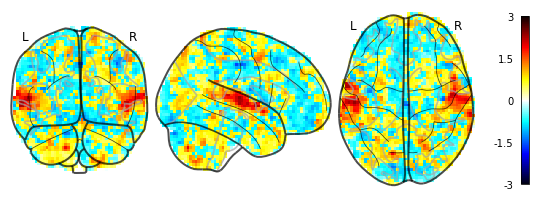

05/31/2020 14:38:03 Reconstruction Error (Frobenius Norm): 1.11633247e+02 out of 8.15328674e+02


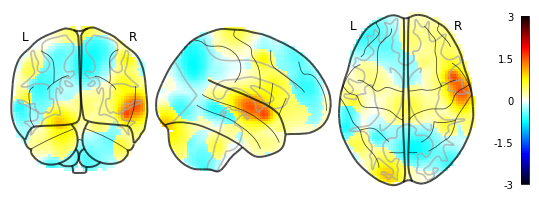

05/31/2020 14:38:05 Reconstruction Error (Frobenius Norm): 8.39389420e+01 out of 8.15328674e+02


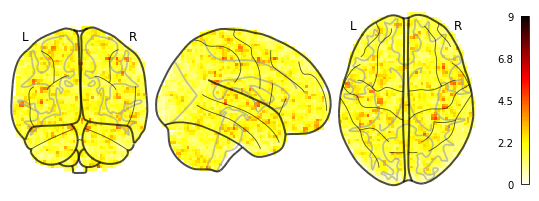

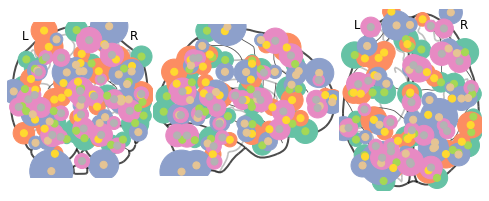

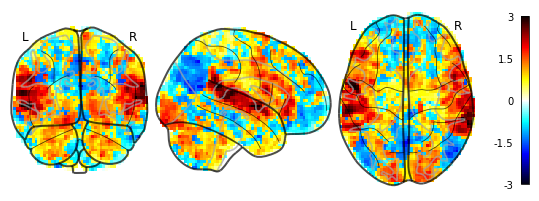

05/31/2020 14:38:08 Reconstruction Error (Frobenius Norm): 1.44562134e+02 out of 8.85320007e+02


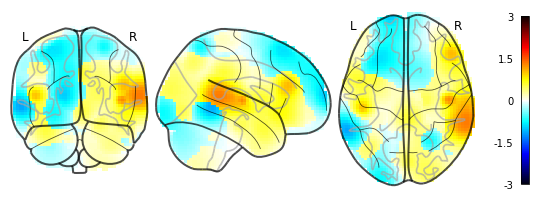

05/31/2020 14:38:09 Reconstruction Error (Frobenius Norm): 1.04998924e+02 out of 8.85320007e+02


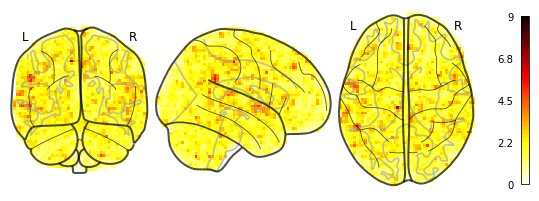

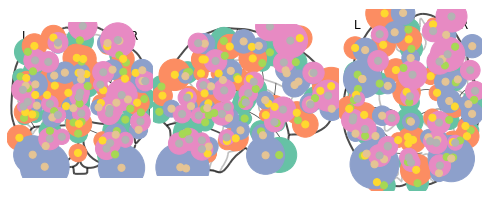

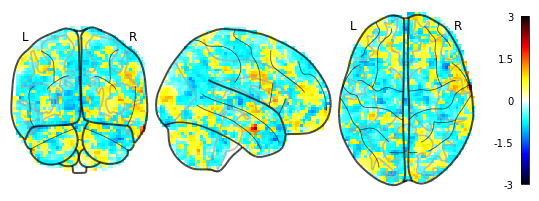

05/31/2020 14:38:13 Reconstruction Error (Frobenius Norm): 1.07968544e+02 out of 8.07556641e+02


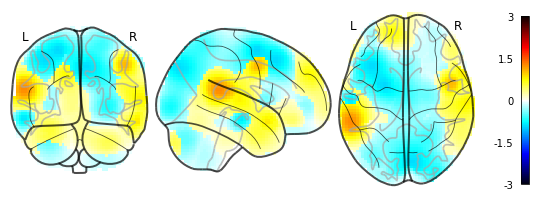

05/31/2020 14:38:14 Reconstruction Error (Frobenius Norm): 7.02488403e+01 out of 8.07556641e+02


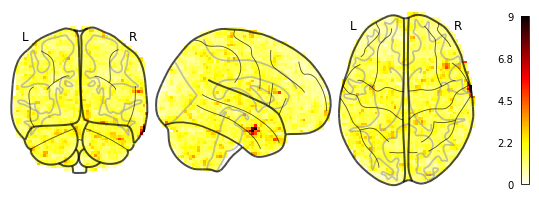

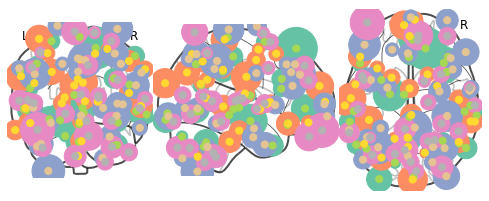

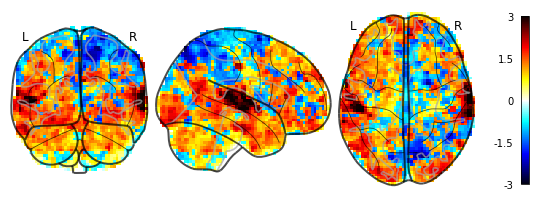

05/31/2020 14:38:18 Reconstruction Error (Frobenius Norm): 1.65424728e+02 out of 9.44142700e+02


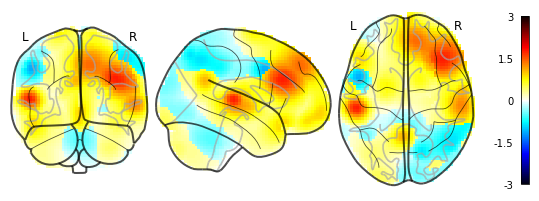

05/31/2020 14:38:19 Reconstruction Error (Frobenius Norm): 1.17627449e+02 out of 9.44142700e+02


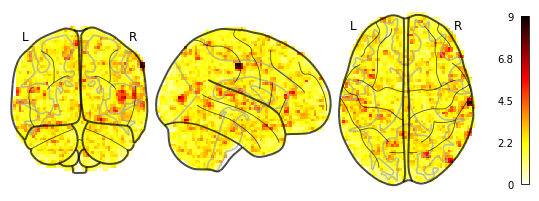

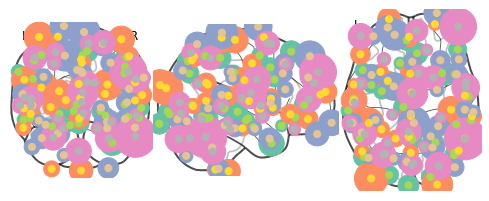

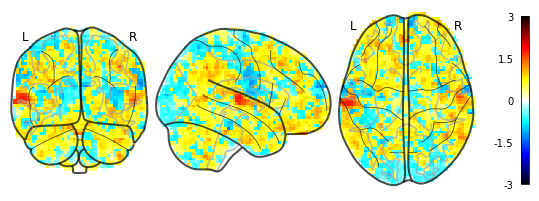

05/31/2020 14:38:23 Reconstruction Error (Frobenius Norm): 1.05843475e+02 out of 7.71454102e+02


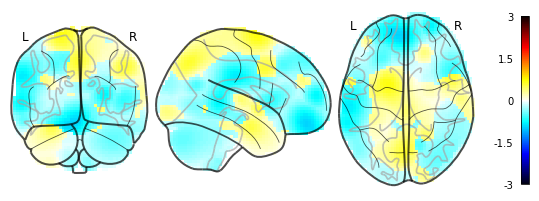

05/31/2020 14:38:24 Reconstruction Error (Frobenius Norm): 7.38609543e+01 out of 7.71454102e+02


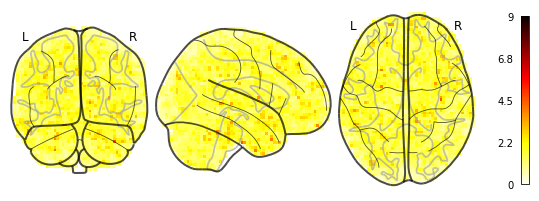

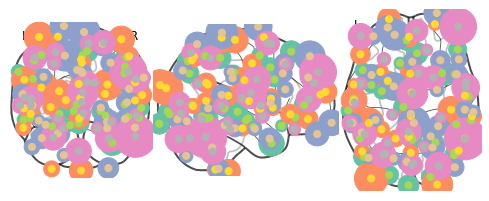

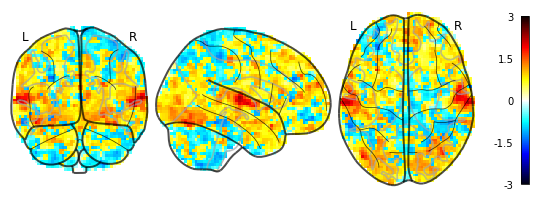

05/31/2020 14:38:28 Reconstruction Error (Frobenius Norm): 1.15462845e+02 out of 7.66293152e+02


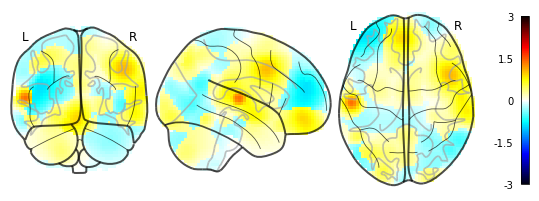

05/31/2020 14:38:29 Reconstruction Error (Frobenius Norm): 8.33751450e+01 out of 7.66293152e+02


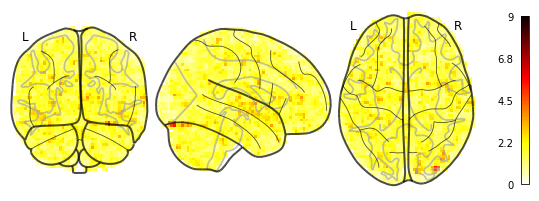

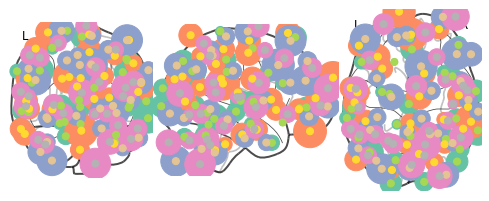

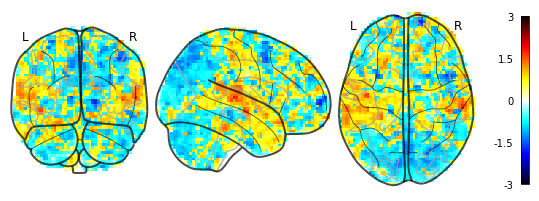

05/31/2020 14:38:33 Reconstruction Error (Frobenius Norm): 1.26554497e+02 out of 8.16404053e+02


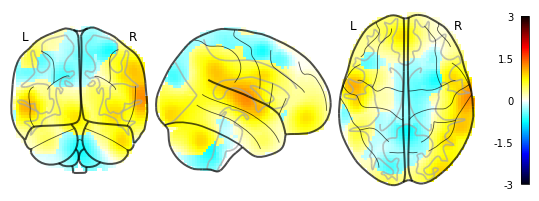

05/31/2020 14:38:34 Reconstruction Error (Frobenius Norm): 8.58189850e+01 out of 8.16404053e+02


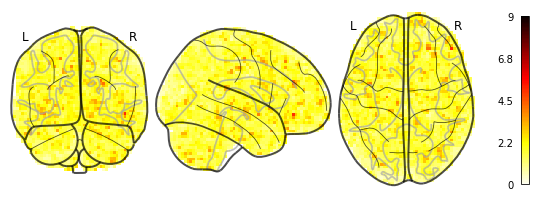

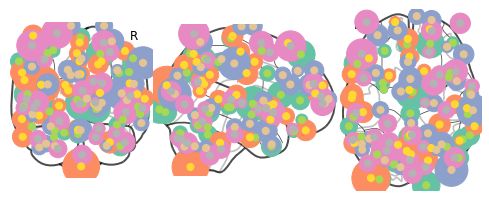

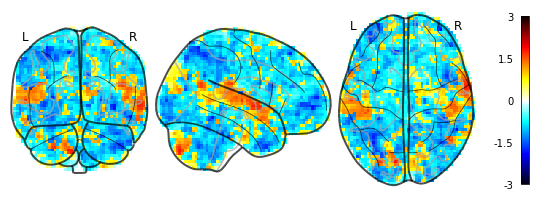

05/31/2020 14:38:38 Reconstruction Error (Frobenius Norm): 1.29070694e+02 out of 8.74308716e+02


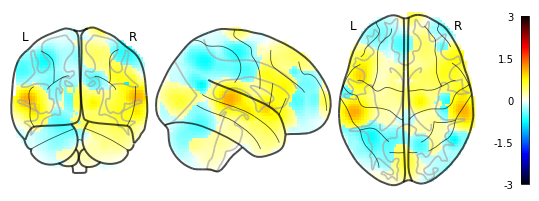

05/31/2020 14:38:39 Reconstruction Error (Frobenius Norm): 9.20201035e+01 out of 8.74308716e+02


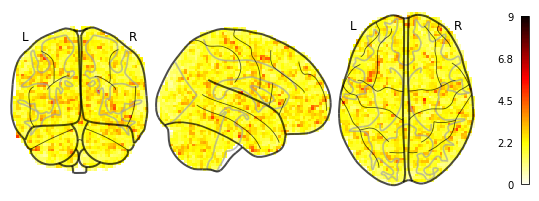

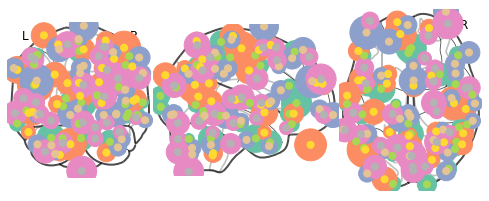

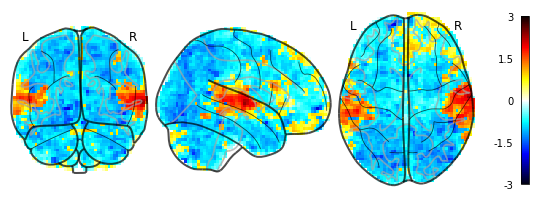

05/31/2020 14:38:43 Reconstruction Error (Frobenius Norm): 1.39012405e+02 out of 7.69490845e+02


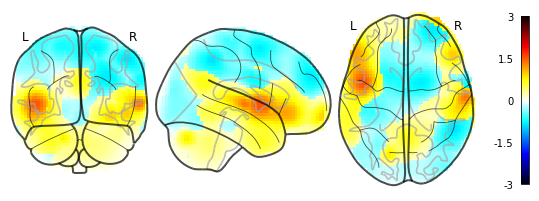

05/31/2020 14:38:44 Reconstruction Error (Frobenius Norm): 8.16333771e+01 out of 7.69490845e+02


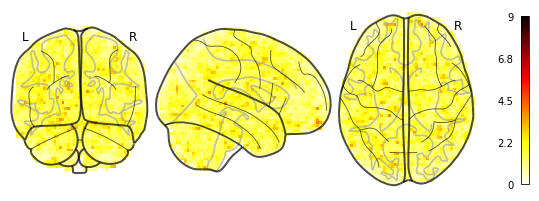

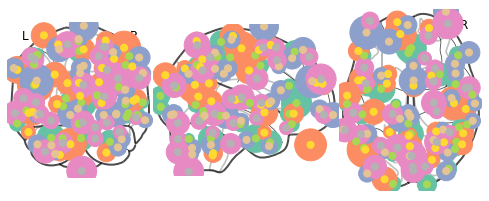

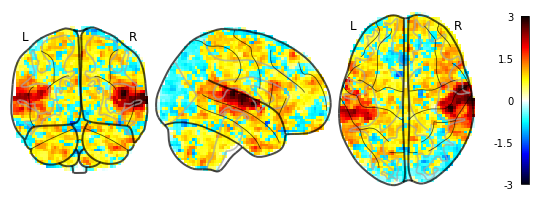

05/31/2020 14:38:47 Reconstruction Error (Frobenius Norm): 1.12187523e+02 out of 8.00959412e+02


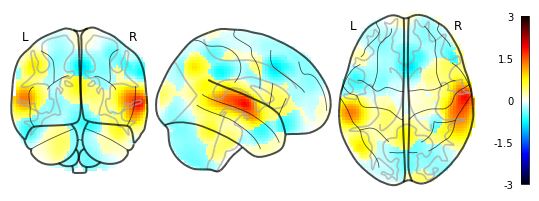

05/31/2020 14:38:49 Reconstruction Error (Frobenius Norm): 8.42356110e+01 out of 8.00959412e+02


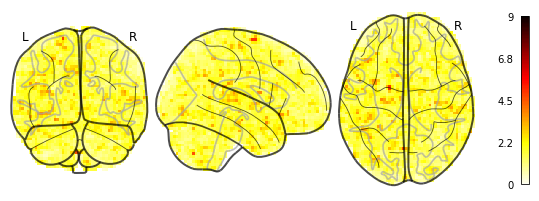

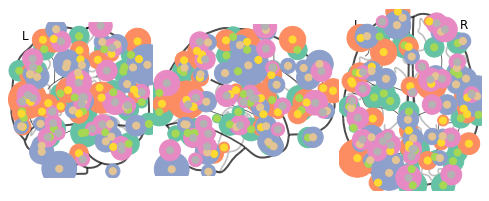

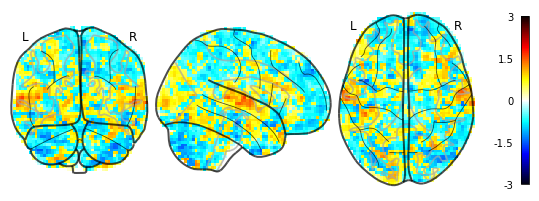

05/31/2020 14:38:52 Reconstruction Error (Frobenius Norm): 9.76456909e+01 out of 8.11815735e+02


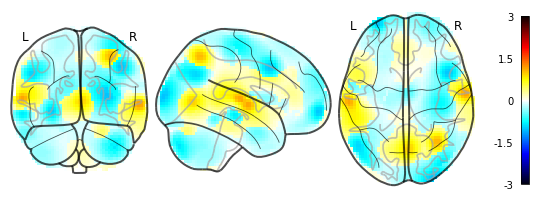

05/31/2020 14:38:54 Reconstruction Error (Frobenius Norm): 8.10085602e+01 out of 8.11815735e+02


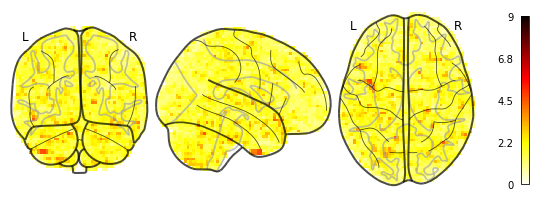

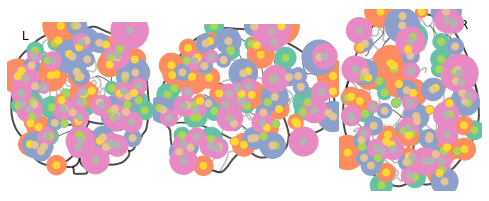

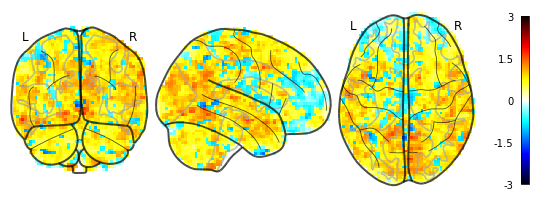

05/31/2020 14:38:57 Reconstruction Error (Frobenius Norm): 1.18471077e+02 out of 8.25840393e+02


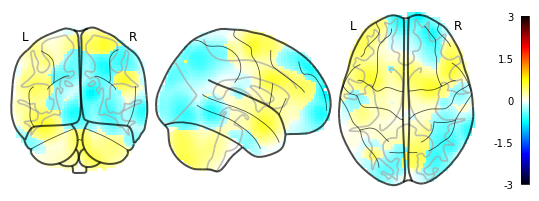

05/31/2020 14:38:59 Reconstruction Error (Frobenius Norm): 7.84054184e+01 out of 8.25840393e+02


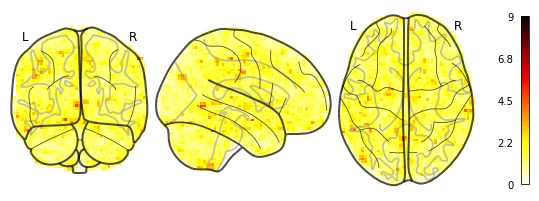

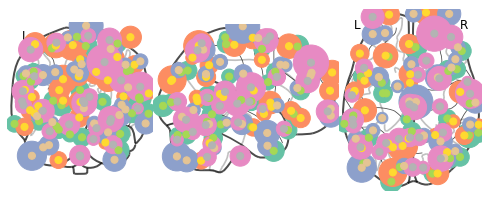

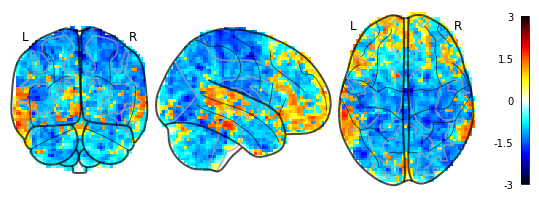

05/31/2020 14:39:02 Reconstruction Error (Frobenius Norm): 1.54727310e+02 out of 8.54286072e+02


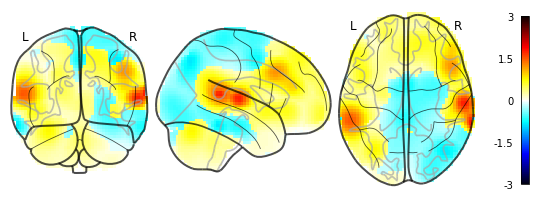

05/31/2020 14:39:04 Reconstruction Error (Frobenius Norm): 9.89942169e+01 out of 8.54286072e+02


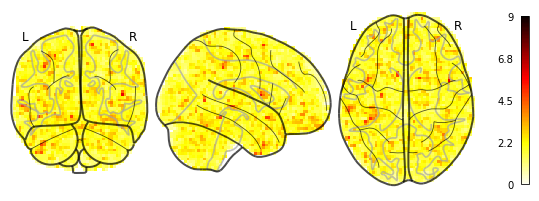

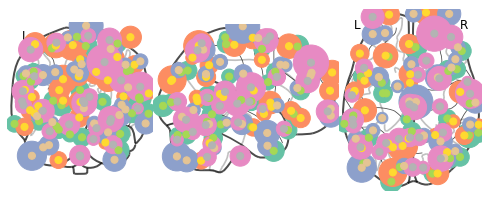

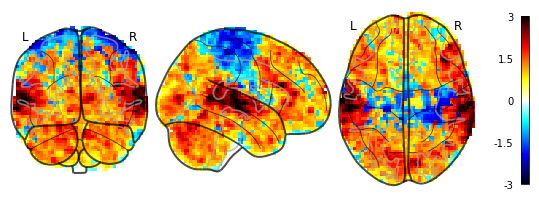

05/31/2020 14:39:07 Reconstruction Error (Frobenius Norm): 1.76893845e+02 out of 9.37374146e+02


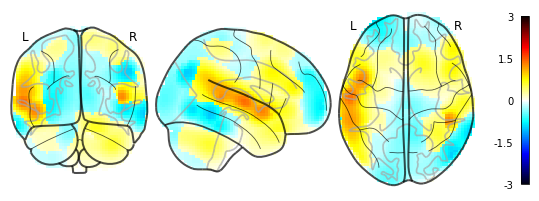

05/31/2020 14:39:08 Reconstruction Error (Frobenius Norm): 1.11440788e+02 out of 9.37374146e+02


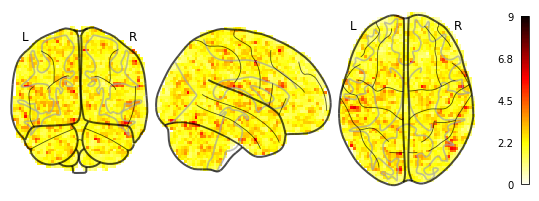

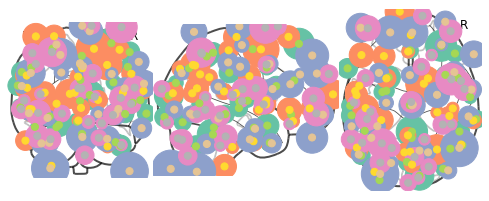

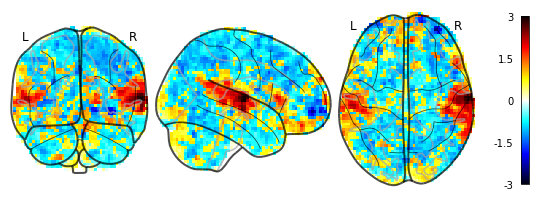

05/31/2020 14:39:12 Reconstruction Error (Frobenius Norm): 1.14949707e+02 out of 8.00525269e+02


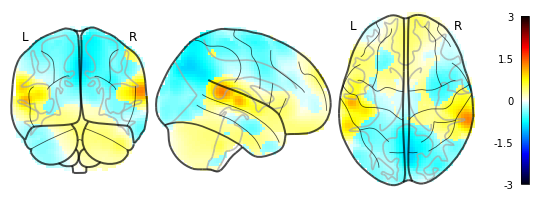

05/31/2020 14:39:13 Reconstruction Error (Frobenius Norm): 9.41435623e+01 out of 8.00525269e+02


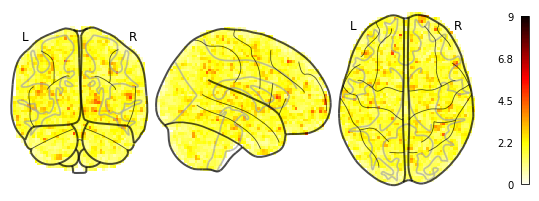

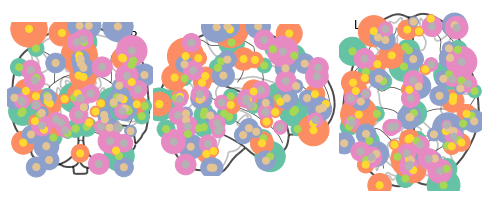

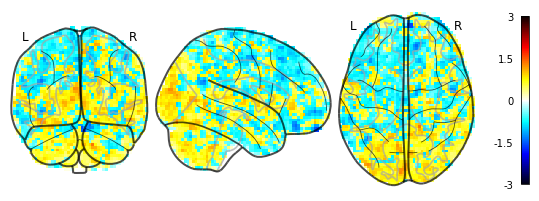

05/31/2020 14:39:17 Reconstruction Error (Frobenius Norm): 9.53322678e+01 out of 8.57255249e+02


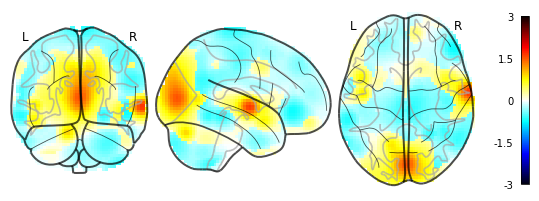

05/31/2020 14:39:18 Reconstruction Error (Frobenius Norm): 7.49786148e+01 out of 8.57255249e+02


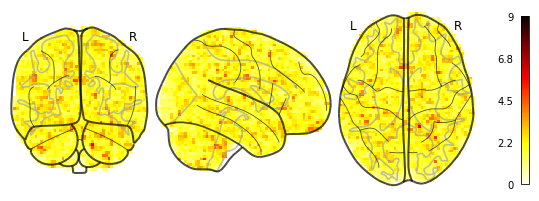

In [15]:
for index in validation_blocks[0:-1:3]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:156: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


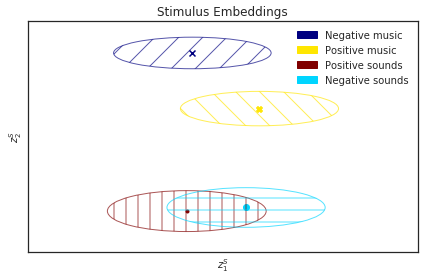

In [16]:
dtfa.scatter_task_embedding(labeler=task_labeler, colormap='jet', figsize=None,
                            filename='lepping_2017_noresponse-task_embedding.pdf',
                            legend_ordering=[0, 2, 3, 1])

In [17]:
dtfa.average_reconstruction_error()

05/31/2020 14:39:46 Average reconstruction error (MSE): 8.90659534e-01
05/31/2020 14:39:46 Average data norm (Euclidean): 1.05002988e+00
05/31/2020 14:39:46 Percent average reconstruction error: 0.342532


(0.890659533593119, 1.0500298773474526, 0.0034253243141409984)

In [18]:
dtfa.average_reconstruction_error(weighted=False)

05/31/2020 14:40:12 Average reconstruction error (MSE): 7.03840073e+02 +/- 4.74761742e+01
05/31/2020 14:40:12 Average data norm (Euclidean): 8.29830954e+02 +/- 5.52383557e+01
05/31/2020 14:40:12 Percent average reconstruction error: 84.940061 +/- 4.71491145e+00


(array([739.58544922, 716.26470947, 652.01025391, 732.5279541 ,
        681.81109619, 694.85913086, 725.95599365, 708.2678833 ,
        630.71813965, 627.92028809, 641.01794434, 634.02294922,
        670.847229  , 722.99572754, 691.87744141, 680.99053955,
        659.77337646, 689.03515625, 673.02966309, 687.6239624 ,
        734.63134766, 744.33032227, 753.24041748, 744.70892334,
        706.12701416, 720.93212891, 718.78936768, 702.13977051,
        685.39898682, 760.44311523, 712.39886475, 736.36962891,
        678.20495605, 689.79614258, 685.34136963, 677.8996582 ,
        636.11254883, 636.40283203, 642.18865967, 602.87371826,
        718.18041992, 658.35272217, 707.82446289, 720.49035645,
        700.66473389, 715.5581665 , 710.05175781, 736.24938965,
        734.89538574, 729.05505371, 735.1817627 , 710.51782227,
        752.00018311, 759.46697998, 766.13909912, 776.56195068,
        748.76635742, 757.61804199, 755.8180542 , 734.90588379,
        710.70788574, 744.8671875 , 687.

In [19]:
def condition_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:156: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


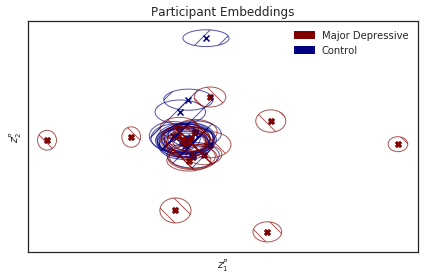

In [20]:
dtfa.scatter_subject_embedding(labeler=condition_labeler, colormap='jet', figsize=None,
                               filename='lepping_2017_noresponse-subject_embedding.pdf')

In [21]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[12428637184.0, -12426276864.0, 2359869.0],
 [12429120512.0, -12425699328.0, 2361543.0]]

In [22]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[2469850368.0, -2469426176.0, 423679.84375],
 [2470224640.0, -2468962560.0, 424388.34375]]